[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/pinecone-io/examples/blob/master/learn/analytics-and-ml/model-training/classifier-train-vector-search/01-fine-tune-vector-search.ipynb) [![Open nbviewer](https://raw.githubusercontent.com/pinecone-io/examples/master/assets/nbviewer-shield.svg)](https://nbviewer.org/github/pinecone-io/examples/blob/master/learn/analytics-and-ml/model-training/classifier-train-vector-search/01-fine-tune-vector-search.ipynb)

In [ ]:
!pip install pinecone-client datasets torch

In [1]:
import pinecone

index_name = "fine-tune-vector-search"

pinecone.init(
    api_key="YOUR_API_KEY",
    environment="YOUR_ENV"  # find next to API key in console
)
index = pinecone.Index(index_name)

In [2]:
from datasets import load_dataset

imagenet = load_dataset(
    'frgfm/imagenette',
    'full_size',
    split='train',
    ignore_verifications=False  # set to True if seeing splits Error
)
imagenet

Reusing dataset imagenette (/Users/jamesbriggs/.cache/huggingface/datasets/frgfm___imagenette/full_size/1.0.0/38929285b8abcae5c1305418e9d8fea5dd6b189bbbd22caba5f5537c7fa0f01f)


Dataset({
    features: ['image', 'label'],
    num_rows: 9469
})

We will start with a generic query, emulating that we don't really know what we're looking for. To create the embedding from that we need to use the natural language part of OpenAI's CLIP.

In [3]:
from transformers import CLIPTokenizerFast, CLIPModel

model_id = "openai/clip-vit-base-patch32"

tokenizer = CLIPTokenizerFast.from_pretrained(model_id)
model = CLIPModel.from_pretrained(model_id)

prompt = "dogs in the snow"

inputs = tokenizer(prompt, return_tensors="pt")
out = model.get_text_features(**inputs)
out.shape

torch.Size([1, 512])

As with our image embeddings, we get a `1, 512` dimension tensor. We perform the same steps to prepare it as a query vector `xq` for Pinecone.

In [4]:
out = out.squeeze(0)
out.shape

torch.Size([512])

In [5]:
import torch

xq = out.cpu().detach().numpy().tolist()
len(xq)

512

We retrieve `10` of the most similar records and store them in `xc`:

In [6]:
xc = index.query(xq, top_k=10, include_values=True)

`xc` contains more than just the vectors, it is a JSON object in the format:

```json
{
    'matches': [
        {
            'id': '<<ID of retrieved item #1>>',
            'score': 0.53,  # float value similarity score
            'values': [-0.22, 0.21, ...],  # the vector embedding itself
        },
        {
            'id': '<<ID of retrieved item #2>>',
            'score': 0.41,
            'values': [-0.19, 0.29, ...],
        },
        ...  # this continues for the 10 records we've returned
    ],
    'namespace': ''
}
```

We don't need all of this information, all we need are the ID values that we will convert to index values for extracting and displaying the images themselves, and the vectors for training the model.

In [7]:
# get the index values
idx = [int(match['id']) for match in xc['matches']]
idx

[5704, 6368, 6031, 6496, 6199, 5833, 6377, 6443, 6155, 5987]

In [8]:
# get the vectors
values = [match['values'] for match in xc['matches']]

Now we can see what these returned images look like.

5704


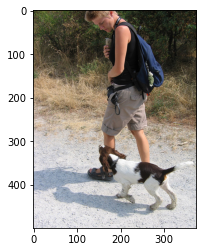

6368


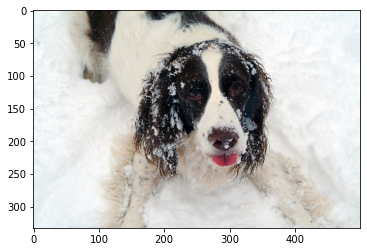

6031


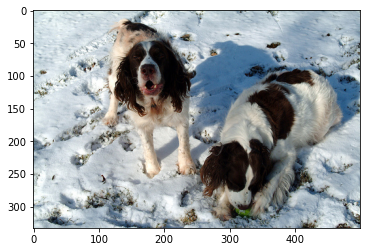

6496


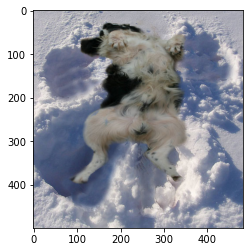

6199


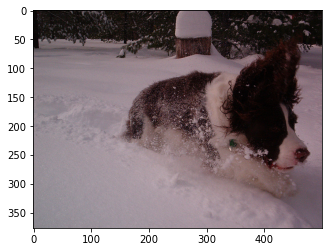

5833


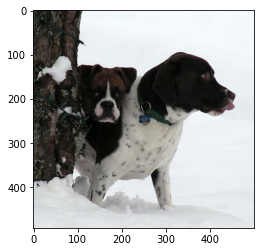

6377


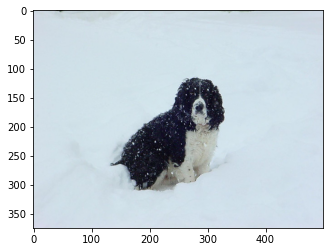

6443


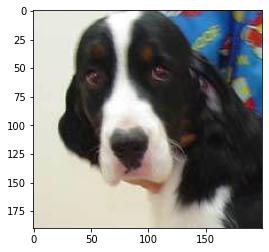

6155


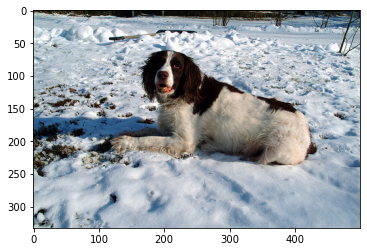

5987


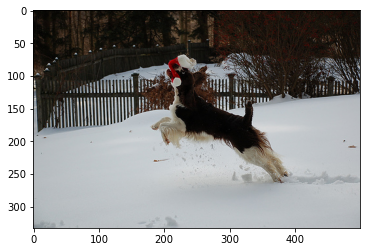

In [9]:
import matplotlib.pyplot as plt

for i in idx:
    print(i)
    plt.imshow(imagenet[i]['image'])
    plt.show()

First we will try optimizing for more "dog in the snow" images, we will do this via contrastive learning, essentially "ranking" the images based on their relevance. The scores given should be within the range `-1` (the opposite of what we want) to `+1` (perfect match). A score of `0` would just be irrelevant. The model is then given a *gradient* of embeddings and their labels to learn from, ideal for learning a direction of movement.

We will use a text input function to create these scores.

In [ ]:
from IPython.display import clear_output
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


def score_images(idx):
    scores = {}

    for i in idx:
        fig = plt.figure(figsize=(18, 6))

        outer = gridspec.GridSpec(1, 2, wspace=0.2, hspace=0.0)
        inner = gridspec.GridSpecFromSubplotSpec(
            3, 3, subplot_spec=outer[1], wspace=0.0, hspace=0.1
        )

        x, y = 0, 0
        for _i in idx:
            if _i == i:
                ax = plt.Subplot(fig, outer[0])
            else:
                ax = plt.Subplot(fig, inner[x, y])
            ax.imshow(imagenet[_i]['image'])
            ax.set_xticks([])
            ax.set_yticks([])
            fig.add_subplot(ax)
            # set position of next subplot
            if _i != i:
                x += 1
                if x == 3:
                    x = 0
                    y += 1
        plt.show()
        # get user input
        score = input("Enter score: ")
        scores[i] = float(score)
        # print the scores for reproducability
        for k, v in scores.items():
            print(f"{k}: {v}", end=", ")
        clear_output(wait=True)
    return scores

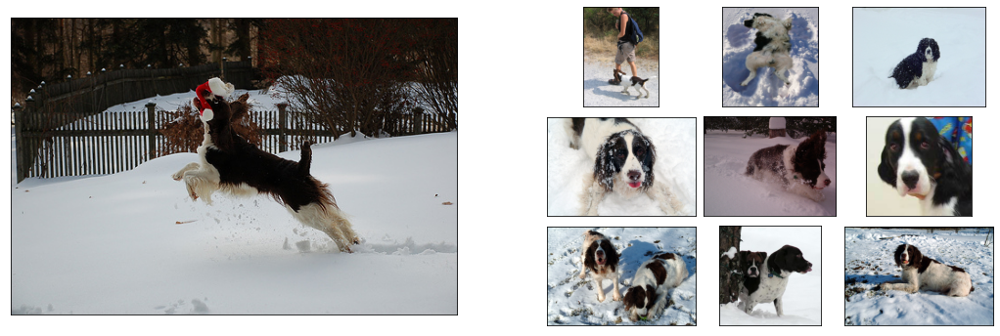

5704: -0.5, 6368: 1.0, 6031: 1.0, 6496: 0.7, 6199: 0.8, 5833: 1.0, 6377: 0.8, 6443: -0.7, 6155: 0.7, 5987: 0.7, 

In [10]:
scores = score_images(idx)

Now we extract the vector values extracted from Pinecone during the `query`, and prepare both these input values `X` and also the `scores` we produces into another labels array `y`. We will use these to train our linear classifier.

In [11]:
idx, scores.keys()  # idx and scores are aligned

([5704, 6368, 6031, 6496, 6199, 5833, 6377, 6443, 6155, 5987],
 dict_keys([5704, 6368, 6031, 6496, 6199, 5833, 6377, 6443, 6155, 5987]))

In [12]:
# we need to extract the embeddings for `X` and align to scores in `y`
X = values  # these are already aligned to `idx` and therefore `scores`
y = list(scores.values())

y

[-0.5, 1.0, 1.0, 0.7, 0.8, 1.0, 0.8, -0.7, 0.7, 0.7]

We will use a linear classifier model to learn the "perfect query" based on our selections. For this we will use a linear layer from PyTorch, find [install instructions for PyTorch here](https://pytorch.org), or just do following (not recommended):

```
!pip install torch
```

In [13]:
import torch

# initialize the model with 512 input size and one output
model = torch.nn.Linear(512, 1)

# convert previous query `xq` to tensor paramater for initial model weights
init_weight = torch.Tensor(xq).reshape(1, -1)
model.weight = torch.nn.Parameter(init_weight)

# init loss and optimizer
loss = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.2)

Now we have our model and first training batch ready, we can perform a training loop with our classifier, which we will define in a function called `fit`:

In [14]:
model.train()  # switch model to training mode

def fit(X: list, y: list, iters: int = 5):
    for _ in range(iters):
        # get predictions
        out = model(torch.Tensor(X))
        # calculate loss
        loss_value = loss(out, torch.Tensor(y).reshape(-1, 1))
        # reset gradients
        optimizer.zero_grad()
        # backpropagate
        loss_value.backward()
        # update weights
        optimizer.step()

In [15]:
# train
fit(X, y)

Now we extract a new query vector from the model weights:

In [16]:
model.weight.shape

torch.Size([1, 512])

We need to convert this to a flat list for Pinecone:

In [17]:
xq = model.weight.detach().numpy()[0].tolist()

Now before we search again we must mark the already retrieved vectors so that we don't retrieve them again. We do this using metadata filtering in Pinecone.

In [18]:
# we must update one record at a time
for i in idx:
    index.update(str(i), set_metadata={"seen": 1})

Now search using the new query vector.

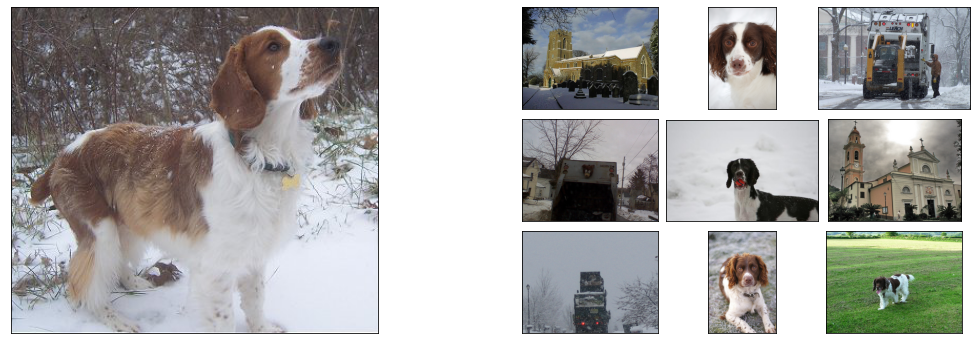

2849: -0.7, 7599: -0.8, 7672: -0.7, 5990: 0.8, 6573: 0.8, 6200: 0.7, 7595: -0.7, 3120: -1.0, 5730: 0.2, 6105: 0.7, 

In [19]:
# retrieve most similar records
xc = index.query(
    xq,
    top_k=10,
    include_values=True,
    filter={"seen": 0}
)
# extract index values
idx = [int(match['id']) for match in xc['matches']]

# begin scoring
scores = score_images(idx)

We will work through a few searches here. So let's clean up our code a little starting with the tuning operation. All we'll do here is place all of the previous logic into a function called `tune`:

In [20]:
def tune(xc, scores, update=True):
    # extract training and label data
    X = [match['values'] for match in xc['matches']]
    y = list(scores.values())
    # train
    fit(X, y)
    # extract new query vector
    xq = model.weight.detach().numpy()[0].tolist()
    # and update the "seen" metadata
    if update:
        # we must update one record at a time
        for i in idx:
            index.update(str(i), set_metadata={"seen": 1})
    return xq

Now we update the model and query (now looking for any dog images - we will try to traverse to dogs in fields and then to dogs at dog shows):

In [21]:
xq = tune(xc, scores)

Now we return to retrieving more images. Again, let's collate all of the logic from before into a single `get_top_k` function:

In [22]:
def get_top_k(xq, top_k=10):
    # query the index
    xc = index.query(
        xq,
        top_k=top_k,
        include_values=True,
        filter={"seen": 0}
    )
    # extract IDs
    idx = [int(match['id']) for match in xc['matches']]
    return idx, xc

Now we retrieve those and score:

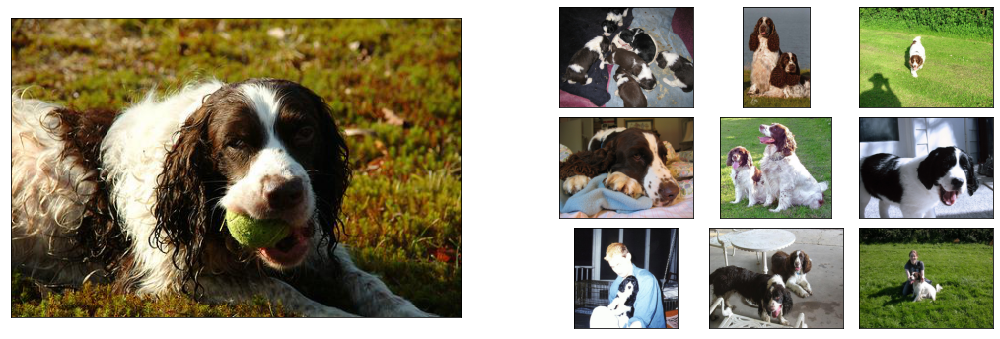

5932: -0.5, 6423: -0.5, 6405: -0.2, 5830: 0.5, 6407: 0.7, 6084: 0.3, 6453: 1.0, 5742: -0.5, 6126: 1.0, 6462: 0.9, 

In [23]:
idx, xc = get_top_k(xq)
scores = score_images(idx)

Okay we have some dogs in grassy fields, let's try and push the query towards more of these, we will need to mark some dog images as irrelevant for this.

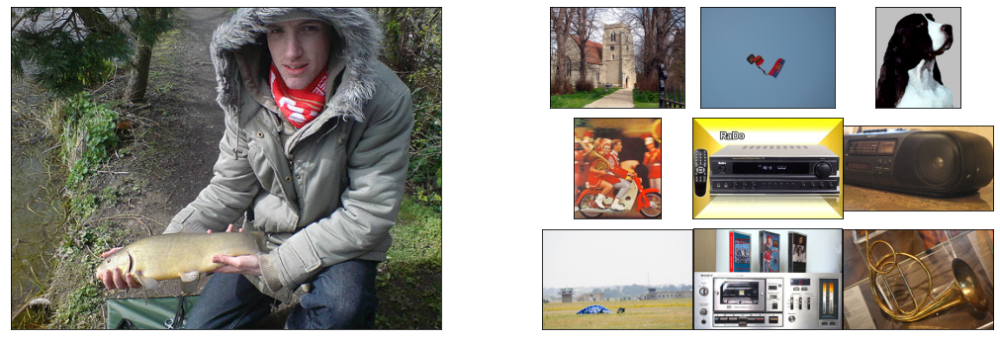

3512: -0.4, 9206: -1.0, 4563: -0.4, 3875: -1.0, 771: -1.0, 562: -1.0, 5930: 1.0, 572: -1.0, 8982: -1.0, 1465: -0.6, 

In [24]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

As we're performing multiple training steps with a high learning rate (`lr`), the model is pretty responsive and moves quickly, in this case the model likely saw the negative dog examples and pulled us away from the dog vectors. We mark all of these as negative to some degree.

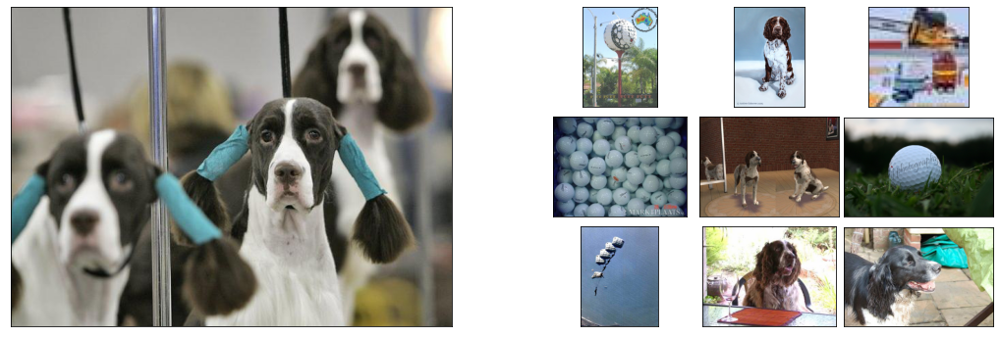

6748: -0.6, 6722: -1.0, 3967: -1.0, 6032: 0.8, 6554: 0.7, 5999: 0.9, 2773: -1.0, 7465: 0.1, 6340: 0.8, 6191: 0.9, 

In [25]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

Now we need to focus on returning to the dog vector space, so we mark all dog images as relevant.

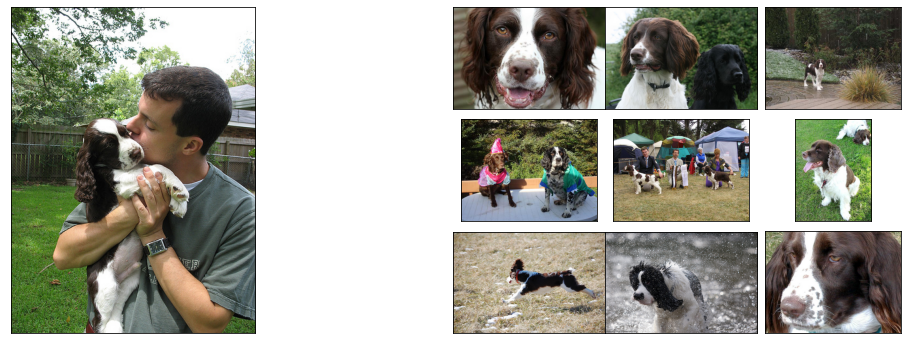

6169: 0.6, 5854: 0.7, 5725: 0.7, 5991: 0.7, 6121: 1.0, 6033: 0.4, 6076: 0.6, 5954: 0.7, 6248: 0.6, 6255: 0.7, 

In [26]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

We have a few dog show/dog in field images here, we'll push towards these.

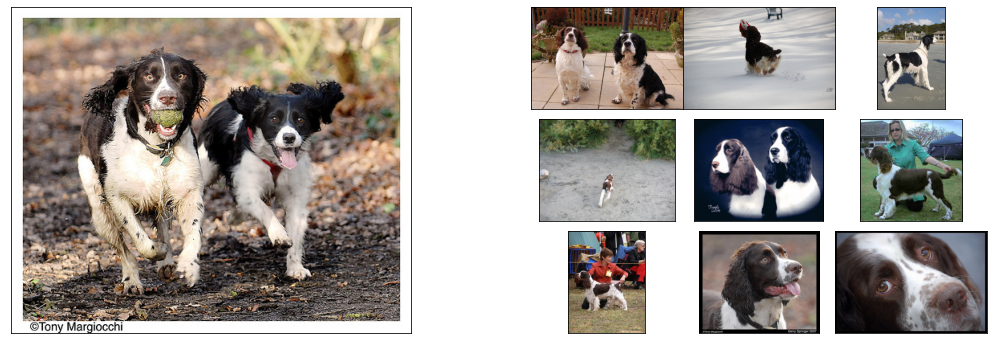

5792: 0.8, 6429: 0.6, 6210: 1.0, 6444: 0.3, 6002: -0.3, 5806: 0.3, 6098: 0.6, 6026: 1.0, 6053: -0.3, 6075: 0.5, 

In [28]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

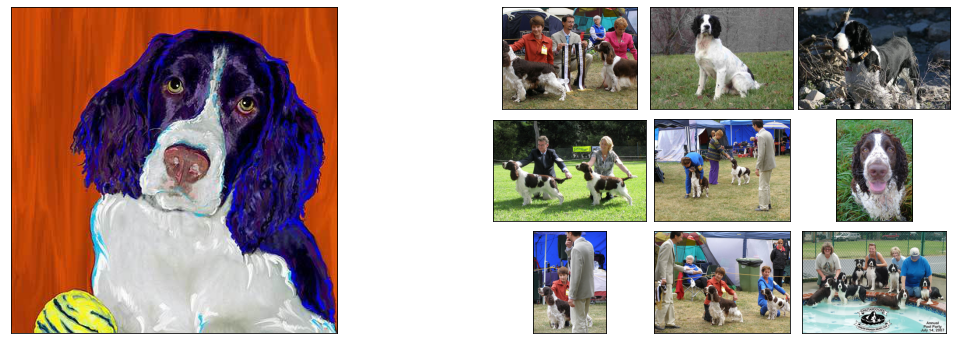

6364: 1.0, 5647: 1.0, 6208: 1.0, 6003: 0.4, 6350: 1.0, 5898: 1.0, 5734: 0.2, 5910: 0.0, 6160: 0.5, 5993: -0.2, 

In [30]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

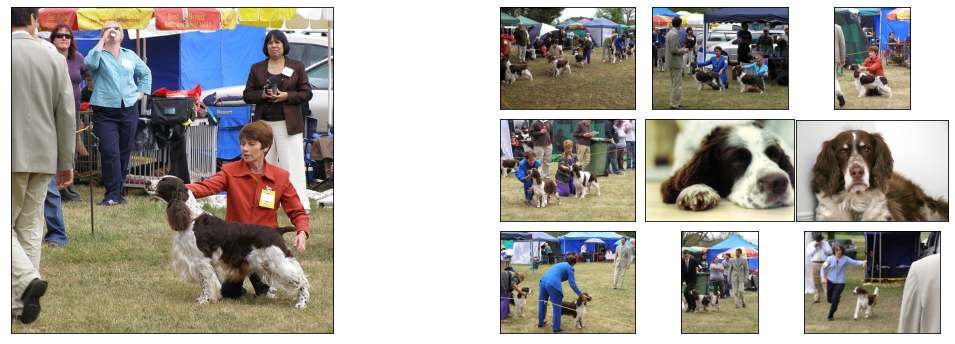

5877: 1.0, 6353: 1.0, 6011: 1.0, 5782: 1.0, 6436: -0.2, 6376: 1.0, 6379: 1.0, 6455: -0.2, 6058: 1.0, 5981: 1.0, 

In [32]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

The classifier is getting pretty good at returning images of dog shows.

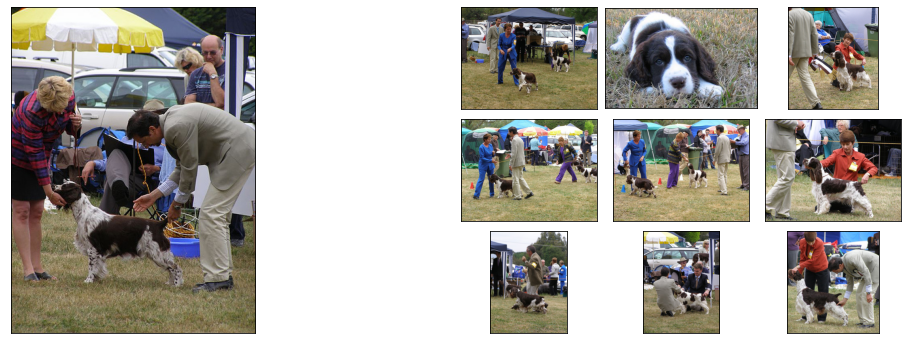

6293: 1.0, 6141: 1.0, 6116: 1.0, 5753: -0.3, 6122: 1.0, 6571: 1.0, 6024: 1.0, 5858: 1.0, 6589: 1.0, 6485: 1.0, 

In [33]:
xq = tune(xc, scores)  # train
idx, xc = get_top_k(xq)  # retrieve
scores = score_images(idx)  # score

Okay, we get the point - we're returning a lot of dog show pictures, our classifier weights are producing pretty good queries. We can continue training like this for a long time, we could even modify our search to look for something new. However, let's move on to searching without any filters to test the performance of our query. There are two options for searching without a filter:

* We drop the `filter` argument, this would not work if needing to perform a second iteration of training over the same data.
* We reset the filter values, switching all records where `{"seen": 1}` back to `{"seen": 0}`.

We will go ahead and take the second approach:

In [34]:
while True:
    xc = index.query(xq, top_k=100, filter={"seen": 1})
    idx = [match['id'] for match in xc['matches']]
    if len(idx) == 0: break
    for i in idx:
        index.update(str(i), set_metadata={"seen": 0})

Now if we search again, we will return a completely unfiltered view of the search results.

6121


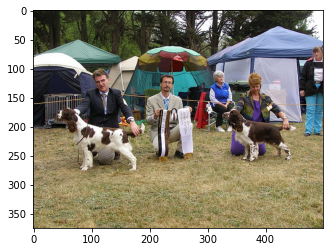

6210


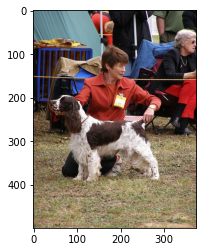

6364


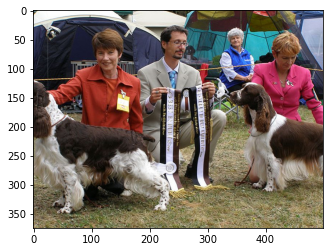

6208


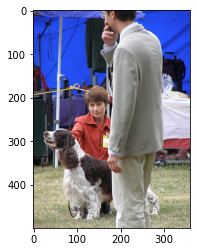

5898


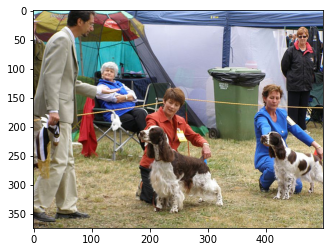

6350


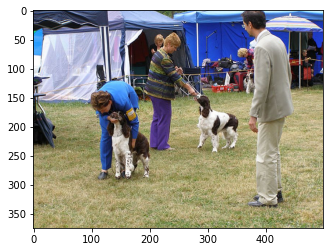

6554


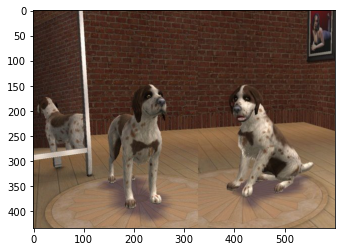

5877


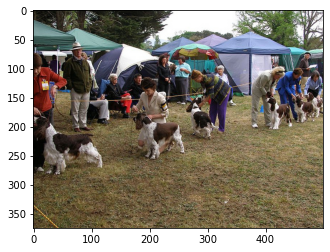

6376


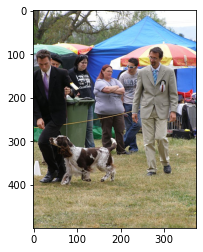

6011


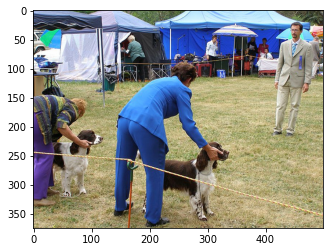

In [35]:
idx, xc = get_top_k(xq)  # retrieve

# show
for i in idx:
    print(i)
    plt.imshow(imagenet[i]['image'])
    plt.show()

Plenty of dog shows!

Now that we've finished optimizing the model weights, we can save them to file.

In [36]:
with open("classifier.pth", "wb") as f:
    torch.save(model, f)

Once we've finished training the classifier we can delete our Pinecone index to save resources.

In [ ]:
pinecone.delete_index(index_name)

---